# Packages

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
from geopandas.tools import sjoin
from shapely.geometry import Point, MultiPolygon, Polygon, MultiPoint, LineString
from shapely import wkt
import matplotlib 
import mapclassify
import time
import folium
import contextily as cx
import json
from copy import copy
import branca.colormap as cm

# Import GFW data

In [2]:
%%time
boats = pd.read_csv('../data/raw/GFW/unknown.csv') 
gdf = gpd.GeoDataFrame(boats, geometry=gpd.GeoSeries.from_xy(boats['lon'], boats['lat']), crs=4326)


CPU times: user 2min 28s, sys: 5.26 s, total: 2min 33s
Wall time: 2min 37s


In [3]:
gdf['boat_id'] = gdf.mmsi.astype('category').cat.codes

### Explore

In [4]:
gdf.head()

,mmsi,timestamp,distance_from_shore,distance_from_port,speed,course,lat,lon,is_fishing,source,geometry,boat_id
0,1.833071e+14,1.343786e+09,314242.1875,538727.93750,13.1,62.700001,2.230797,157.382812,-1.0,crowd_sourced,POINT (157.38281 2.23080),80
1,1.833071e+14,1.343786e+09,314242.1875,538727.93750,13.8,65.199997,2.232352,157.386047,-1.0,crowd_sourced,POINT (157.38605 2.23235),80
2,1.833071e+14,1.343792e+09,343947.9375,513526.09375,13.0,61.700001,2.410787,157.745605,-1.0,crowd_sourced,POINT (157.74561 2.41079),80
3,1.833071e+14,1.343799e+09,369211.7500,491134.56250,13.4,63.799999,2.591992,158.094574,-1.0,crowd_sourced,POINT (158.09457 2.59199),80
4,1.833071e+14,1.343805e+09,362496.2500,472878.43750,12.6,66.000000,2.759518,158.458908,-1.0,crowd_sourced,POINT (158.45891 2.75952),80


In [8]:
gdf.shape

(6811552, 12)

In [5]:
def expl_plot(gdf, boat_list):

    gdf_in_boat_list = gdf[gdf.boat_id.isin(boat_list)]

    linear = cm.LinearColormap(["green", "yellow", "red"], 
                                vmin=gdf_in_boat_list['boat_id'].values.min(), 
                                vmax=gdf_in_boat_list['boat_id'].values.max())

    m = folium.Map(location=[gdf.lat.mean(), gdf.lon.mean()], zoom_start=3)
    for boat in boat_list:
        boat_gdf = gdf_in_boat_list[gdf.boat_id == boat]
        folium.PolyLine(boat_gdf[['lat', 'lon']].values.tolist(), 
                        color=linear(boat_gdf['boat_id'].values[0]), 
                        weight=2,
                        opacity=0.5).add_to(m)
    return m

expl_plot(gdf, [0, 10, 20, 30, 40, 50, 60, 70, 80, 90])

/Users/martinvanderlinden/opt/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1415: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)
/Users/martinvanderlinden/opt/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1415: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)
/Users/martinvanderlinden/opt/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1415: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)
/Users/martinvanderlinden/opt/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1415: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)
/Users/martinvanderlinden/opt/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1415: UserWarning: Boolean Series key will be reindexed to

# Detect possible transbordement around a single "timestamp"

In [4]:
def too_close_for_confort(gdf,
                          timestamp,
                          time_buff_thresh,
                          spatial_buffer_thresh,
                          speed_thresh,
                          dst_from_shore_thresh):
    filt_gdf = gdf.loc[(gdf.speed <= speed_thresh) &
                        (gdf.distance_from_shore >= dst_from_shore_thresh)]
    timed_gdf = filt_gdf.loc[(filt_gdf.timestamp >= timestamp - time_buff_thresh) &
                             (filt_gdf.timestamp  <= timestamp + time_buff_thresh)]
    grouped_gdf = timed_gdf.dissolve(by = 'boat_id')
    # A form of "groupby" specific to gpd's, 
    # see https://geopandas.org/en/stable/docs/user_guide/aggregation_with_dissolve.html
    grouped_gdf['buffed'] = grouped_gdf.geometry.apply(
        lambda x: x.buffer(spatial_buffer_thresh) if
                  x.type == 'Point' else
                  LineString([(pt.x, pt.y) for pt in x.geoms]).buffer(spatial_buffer_thresh))
    grouped_gdf.set_geometry('buffed')
    joined = grouped_gdf.sjoin(grouped_gdf, how="inner", predicate='intersects')
    return joined[joined['mmsi_left'] != joined['mmsi_right']]


### Tests

#### Negative sample case

In [5]:
too_close_for_confort(gdf,
                      gdf['timestamp'][1000], # timestamp
                      3600, # time_buff_thresh
                      0.1,  # spatial_buffer_thresh
                      1, # speed_thresh
                      500)  # dst_from_shore_thresh

,geometry,mmsi_left,timestamp_left,distance_from_shore_left,distance_from_port_left,speed_left,course_left,lat_left,lon_left,is_fishing_left,...,timestamp_right,distance_from_shore_right,distance_from_port_right,speed_right,course_right,lat_right,lon_right,is_fishing_right,source_right,buffed_right
boat_id,,,,,,,,,,,,,,,,,,,,,


#### Construct positive sample

##### Positive sample because idential

In [6]:
first_boat = gdf[gdf.boat_id == 0]
first_boat_with_a_twist = first_boat.copy()
first_boat_with_a_twist['mmsi'] = 123456789
first_boat_with_a_twist['boat_id'] = 123456789
positive_example = pd.concat([first_boat, first_boat_with_a_twist])
positive_example

,mmsi,timestamp,distance_from_shore,distance_from_port,speed,course,lat,lon,is_fishing,source,geometry,boat_id
48764,1.272260e+12,1.325378e+09,193639.250000,211004.296875,1.0,82.000000,2.844265,-6.596088,-1.0,false_positives,POINT (-6.59609 2.84426),0
48765,1.272260e+12,1.325378e+09,193639.250000,211004.296875,1.0,81.000000,2.844292,-6.595800,-1.0,false_positives,POINT (-6.59580 2.84429),0
48766,1.272260e+12,1.325378e+09,193639.250000,211004.296875,1.0,84.000000,2.844307,-6.595548,-1.0,false_positives,POINT (-6.59555 2.84431),0
48767,1.272260e+12,1.325385e+09,194090.578125,210054.359375,0.9,69.000000,2.850688,-6.565639,-1.0,false_positives,POINT (-6.56564 2.85069),0
48768,1.272260e+12,1.325385e+09,194090.578125,210054.359375,1.0,77.000000,2.851090,-6.564338,-1.0,false_positives,POINT (-6.56434 2.85109),0
...,...,...,...,...,...,...,...,...,...,...,...,...
99340,1.234568e+08,1.480028e+09,0.000000,4123.004395,0.0,274.200012,5.288764,-4.015069,-1.0,false_positives,POINT (-4.01507 5.28876),123456789
99341,1.234568e+08,1.480028e+09,0.000000,4123.004395,0.0,227.600006,5.288777,-4.015113,-1.0,false_positives,POINT (-4.01511 5.28878),123456789
99342,1.234568e+08,1.480029e+09,0.000000,4123.004395,0.0,179.399994,5.288777,-4.015082,-1.0,false_positives,POINT (-4.01508 5.28878),123456789
99343,1.234568e+08,1.480030e+09,0.000000,4123.004395,0.0,302.100006,5.288778,-4.015079,-1.0,false_positives,POINT (-4.01508 5.28878),123456789


In [7]:
too_close_for_confort(positive_example,
                      positive_example['timestamp'].iloc[100], # timestamp
                      3600, # time_buff_thresh
                      0.1,  # spatial_buffer_thresh
                      1, # speed_thresh
                      500)  # dst_from_shore_thresh

,geometry,mmsi_left,timestamp_left,distance_from_shore_left,distance_from_port_left,speed_left,course_left,lat_left,lon_left,is_fishing_left,...,timestamp_right,distance_from_shore_right,distance_from_port_right,speed_right,course_right,lat_right,lon_right,is_fishing_right,source_right,buffed_right
boat_id,,,,,,,,,,,,,,,,,,,,,
123456789,"MULTIPOINT (-7.06604 2.90271, -7.06601 2.90273...",1.234568e+08,1.325635e+09,169288.5,179508.828125,0.2,40.0,2.902708,-7.066038,-1.0,...,1.325635e+09,169288.5,179508.828125,0.2,40.0,2.902708,-7.066038,-1.0,false_positives,"POLYGON ((-7.13544 2.97456, -7.13551 2.97463, ..."
0,"MULTIPOINT (-7.06604 2.90271, -7.06601 2.90273...",1.272260e+12,1.325635e+09,169288.5,179508.828125,0.2,40.0,2.902708,-7.066038,-1.0,...,1.325635e+09,169288.5,179508.828125,0.2,40.0,2.902708,-7.066038,-1.0,false_positives,"POLYGON ((-7.13544 2.97456, -7.13551 2.97463, ..."


##### Positive sample because almost identical

,geometry,mmsi_left,timestamp_left,distance_from_shore_left,distance_from_port_left,speed_left,course_left,lat_left,lon_left,is_fishing_left,...,timestamp_right,distance_from_shore_right,distance_from_port_right,speed_right,course_right,lat_right,lon_right,is_fishing_right,source_right,buffed_right
boat_id,,,,,,,,,,,,,,,,,,,,,


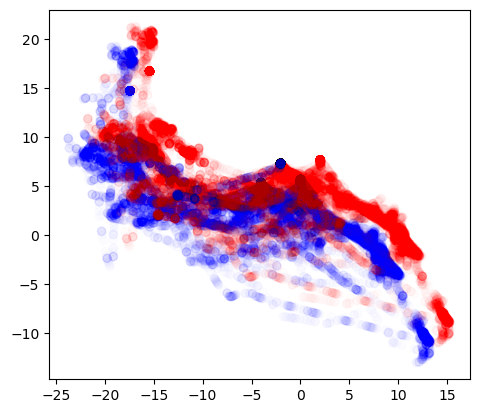

In [8]:
first_boat_with_a_noisy_twist = first_boat_with_a_twist.copy()
m_noise = 2
v_noise = 0
first_boat_with_a_noisy_twist['geometry'] = first_boat_with_a_noisy_twist['geometry'].apply(lambda x: Point(x.x + np.random.normal(m_noise, v_noise, 1),
                                                                                                            x.y + np.random.normal(m_noise, v_noise, 1)))

positive_noisy_example = pd.concat([first_boat, first_boat_with_a_noisy_twist])

positive_noisy_example.plot(color= gdf['boat_id'].apply(lambda x: 'red' if x == 0 else 'blue'),
                            alpha=0.01)

too_close_for_confort(positive_noisy_example,
                      positive_noisy_example['timestamp'].iloc[100], # timestamp
                      3600, # time_buff_thresh
                      1,  # spatial_buffer_thresh
                      1, # speed_thresh
                      500)  # dst_from_shore_thresh

In [9]:
investigate = positive_noisy_example.copy()
diss = investigate.dissolve(by = 'mmsi')

In [10]:
# diss['buffed'] = diss['geometry'].buffer(1) 
# NEED TO BUILD LINE FIRST
# Buffer around multipoint is VERY slow

diss['buffed'] =  diss['geometry'].apply(lambda x : LineString([(pt.x, pt.y) for pt in x.geoms]))

In [12]:
diss['buffed'].buffer(1)

/var/folders/nn/c6t1x8lx6g776w92b2b_yc7h0000gn/T/ipykernel_19047/1093890543.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  diss['buffed'].buffer(1)


,mmsi,timestamp,distance_from_shore,distance_from_port,speed,course,lat,lon,is_fishing,source,geometry,boat_id,buffed
48764,1.272260e+12,1.325378e+09,193639.250000,211004.296875,1.0,82.000000,2.844265,-6.596088,-1.0,false_positives,POINT (-6.59609 2.84426),0,"POLYGON ((-5.59609 2.84426, -5.60090 2.74625, ..."
48765,1.272260e+12,1.325378e+09,193639.250000,211004.296875,1.0,81.000000,2.844292,-6.595800,-1.0,false_positives,POINT (-6.59580 2.84429),0,"POLYGON ((-5.59580 2.84429, -5.60062 2.74627, ..."
48766,1.272260e+12,1.325378e+09,193639.250000,211004.296875,1.0,84.000000,2.844307,-6.595548,-1.0,false_positives,POINT (-6.59555 2.84431),0,"POLYGON ((-5.59555 2.84431, -5.60036 2.74629, ..."
48767,1.272260e+12,1.325385e+09,194090.578125,210054.359375,0.9,69.000000,2.850688,-6.565639,-1.0,false_positives,POINT (-6.56564 2.85069),0,"POLYGON ((-5.56564 2.85069, -5.57045 2.75267, ..."
48768,1.272260e+12,1.325385e+09,194090.578125,210054.359375,1.0,77.000000,2.851090,-6.564338,-1.0,false_positives,POINT (-6.56434 2.85109),0,"POLYGON ((-5.56434 2.85109, -5.56915 2.75307, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99340,1.234568e+08,1.480028e+09,0.000000,4123.004395,0.0,274.200012,5.288764,-4.015069,-1.0,false_positives,POINT (-2.01507 7.28876),123456789,"POLYGON ((-1.01507 7.28876, -1.01988 7.19075, ..."
99341,1.234568e+08,1.480028e+09,0.000000,4123.004395,0.0,227.600006,5.288777,-4.015113,-1.0,false_positives,POINT (-2.01511 7.28878),123456789,"POLYGON ((-1.01511 7.28878, -1.01993 7.19076, ..."
99342,1.234568e+08,1.480029e+09,0.000000,4123.004395,0.0,179.399994,5.288777,-4.015082,-1.0,false_positives,POINT (-2.01508 7.28878),123456789,"POLYGON ((-1.01508 7.28878, -1.01990 7.19076, ..."
99343,1.234568e+08,1.480030e+09,0.000000,4123.004395,0.0,302.100006,5.288778,-4.015079,-1.0,false_positives,POINT (-2.01508 7.28878),123456789,"POLYGON ((-1.01508 7.28878, -1.01989 7.19076, ..."


# Apply to multiple timestamps

In [328]:
uni_ts = gdf['timestamp'].unique()
len(uni_ts)

6218004

In [350]:
close_over_time = pd.DataFrame()

min_it = 1
max_it = 10000

from time import sleep
from tqdm import tqdm

for i in tqdm(range(min_it,max_it)):
    timestamp = uni_ts[i]
    #print(i/(max_it-min_it))
    close = too_close_for_confort(gdf,
                                  timestamp,
                                  3600,
                                  0.1,
                                  1,
                                  500)
    if close.shape[0] > 0:
        print(close)
        close_over_time = pd.concat([close_over_time, close])  
    

 20%|█▉        | 1971/9999 [05:18<21:38,  6.18it/s]  


KeyboardInterrupt: 

In [333]:
close_over_time.head()

""
